In [ ]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from skimage.io import imread
#https://towardsdatascience.com/how-to-cluster-images-based-on-visual-similarity-cd6e7209fe34

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
df = pd.read_csv('stats.csv')
df = df.rename(columns={"0": "asfalto", "1": "arvore", "2":"cimento", "3":"telhado1", "4":"telhado2", "5":"telhado3", "6":"grama", "7":"piscina", "8":"solo", "9":"icm", '10':'file'})
df.head()

,Unnamed: 0,asfalto,arvore,cimento,telhado1,telhado2,telhado3,grama,piscina,solo,icm,file
0,0,2071.0,2504.0,6391.0,5153.0,16472.0,5573.0,1836.0,0.0,0.0,1.0,3784.0
1,1,7771.0,3718.0,2491.0,0.0,2274.0,2649.0,20081.0,0.0,1016.0,1.0,5272.0
2,2,8105.0,646.0,3896.0,2633.0,1863.0,6756.0,71.0,172.0,15858.0,1.0,4121.0
3,3,9291.0,8275.0,2663.0,4721.0,14702.0,332.0,0.0,0.0,16.0,1.0,3260.0
4,4,14395.0,5185.0,620.0,16325.0,23.0,91.0,1638.0,1152.0,571.0,1.0,4352.0


In [ ]:
features = df[['asfalto', 'arvore', 'cimento', 'telhado1', 'telhado2', 'telhado3', 'grama', 'piscina', 'solo']]
classes = list(df['icm'])
files = list(df['file'])
files = [int(s) for s in files]
files = ['classe' + str(int(classes[idx])) + '/' + str(s) + '.tif' for idx, s in enumerate (files)]

In [ ]:
files = ['/content/gdrive/My Drive/icm_classificacao/dataset_fusion2/aerea/casa/train/' + i for i in files]

In [ ]:
features.shape

(1200, 9)

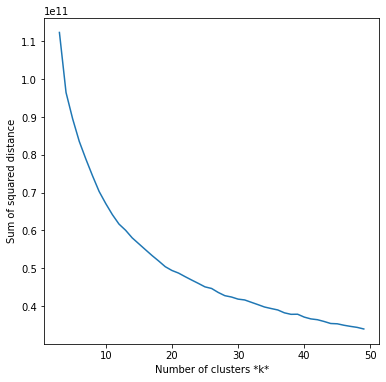

In [ ]:
sse = []
list_k = list(range(3, 50))
for k in list_k:
    km = KMeans(n_clusters=k, random_state=22)
    km.fit(features)
    sse.append(km.inertia_)


plt.figure(figsize=(6, 6))
plt.plot(list_k, sse)
plt.xlabel(r'Number of clusters *k*')
plt.ylabel('Sum of squared distance');

### 3 Clusters

In [ ]:
kmeans = KMeans(n_clusters=3, random_state=22)
kmeans.fit(features)

KMeans(n_clusters=3, random_state=22)

In [ ]:
features2 = features.copy()
features2['label_cluster'] = kmeans.labels_

In [ ]:
pca = PCA(2)
df_pca = pca.fit_transform(features)
df_pca = pd.DataFrame(df_pca)
df_pca['label_cluster'] = kmeans.labels_
df_pca['icm'] = classes

In [ ]:
df_pca

,0,1,label_cluster,icm
0,4124.307463,11611.176182,1,1.0
1,460.623061,2940.296899,2,1.0
2,-1940.685830,3998.267764,2,1.0
3,5481.182088,5988.037559,1,1.0
4,-10135.265351,-5654.231608,2,1.0
...,...,...,...,...
1195,6683.766402,-5163.129692,0,3.0
1196,-5338.567439,919.525546,2,3.0
1197,2580.491379,-3813.540969,0,3.0
1198,2527.244830,-9167.084084,0,3.0


In [ ]:
print(pca.explained_variance_ratio_)

[0.32677227 0.28416554]


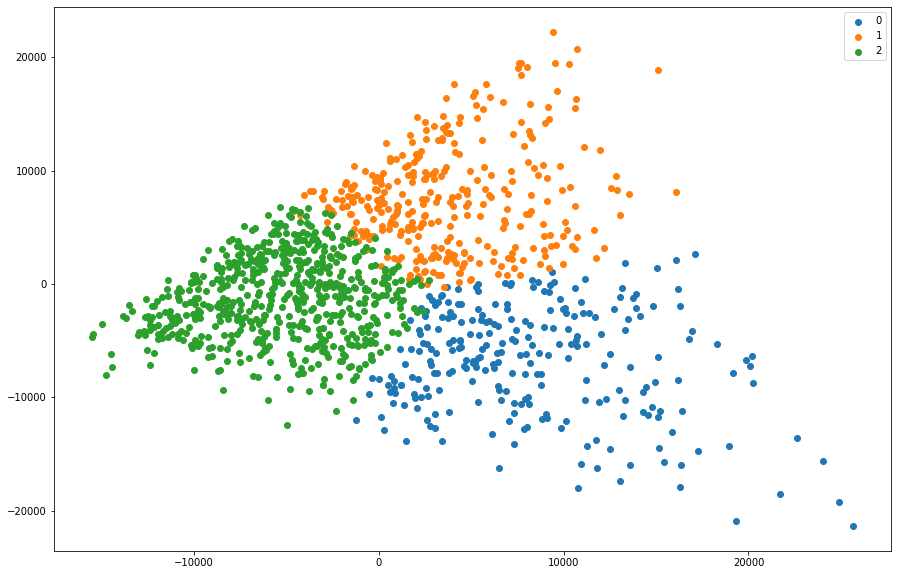

In [ ]:
u_labels = np.unique(kmeans.labels_)
fig = plt.figure(figsize=(15, 10))
for i in u_labels:
    plt.scatter(df_pca[df_pca['label_cluster'] == i][0] , df_pca[df_pca['label_cluster'] == i][1] , label = i)

plt.legend()
plt.show()

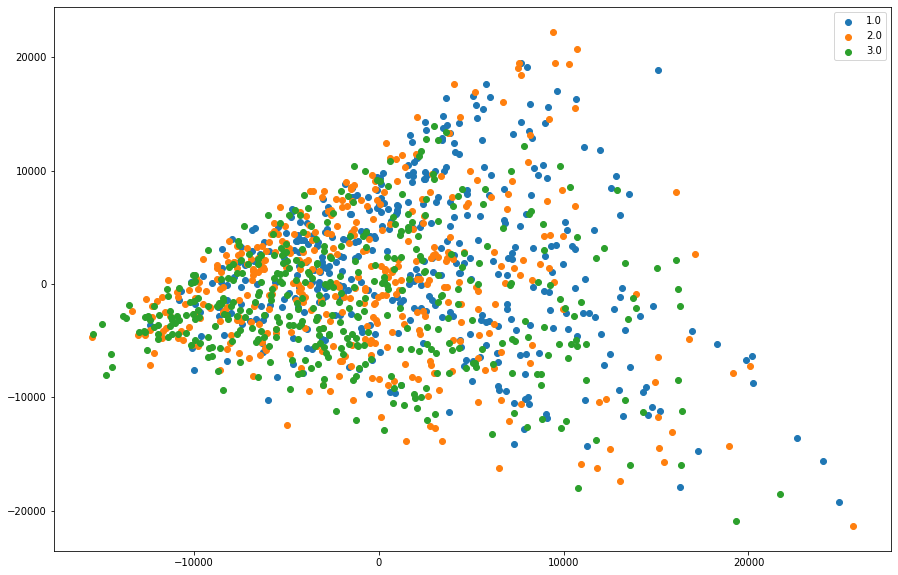

In [ ]:
fig = plt.figure(figsize=(15, 10))
for icm in [1.0, 2.0, 3.0]:
    plt.scatter(df_pca[df_pca['icm'] == icm][0] , df_pca[df_pca['icm'] == icm][1] , label = icm)

plt.legend()
plt.show()

In [ ]:
cluster1 = df_pca[df_pca['label_cluster'] == 0]
cluster1_icm1 = len(cluster1[cluster1['icm'] == 1.0]) / len(cluster1)
cluster1_icm2 = len(cluster1[cluster1['icm'] == 2.0]) / len(cluster1)
cluster1_icm3 = len(cluster1[cluster1['icm'] == 3.0]) / len(cluster1)

cluster2 = df_pca[df_pca['label_cluster'] == 1]
cluster2_icm1 = len(cluster2[cluster2['icm'] == 1.0]) / len(cluster2)
cluster2_icm2 = len(cluster2[cluster2['icm'] == 2.0]) / len(cluster2)
cluster2_icm3 = len(cluster2[cluster2['icm'] == 3.0]) / len(cluster2)

cluster3 = df_pca[df_pca['label_cluster'] == 2]
cluster3_icm1 = len(cluster3[cluster3['icm'] == 1.0]) / len(cluster3)
cluster3_icm2 = len(cluster3[cluster3['icm'] == 2.0]) / len(cluster3)
cluster3_icm3 = len(cluster3[cluster3['icm'] == 3.0]) / len(cluster3)

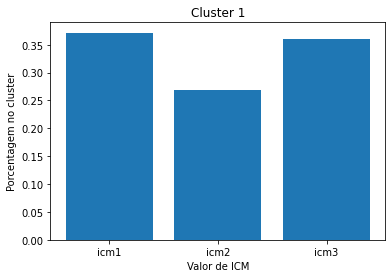

In [ ]:
fig = plt.figure()
plt.bar(['icm1', 'icm2', 'icm3'], [cluster1_icm1, cluster1_icm2, cluster1_icm3])
plt.xlabel("Valor de ICM")
plt.ylabel("Porcentagem no cluster")
plt.title("Cluster 1")
plt.show()

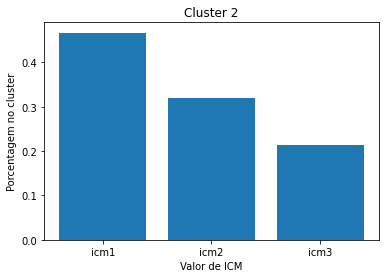

In [ ]:
fig = plt.figure()
plt.bar(['icm1', 'icm2', 'icm3'], [cluster2_icm1, cluster2_icm2, cluster2_icm3])
plt.xlabel("Valor de ICM")
plt.ylabel("Porcentagem no cluster")
plt.title("Cluster 2")
plt.show()

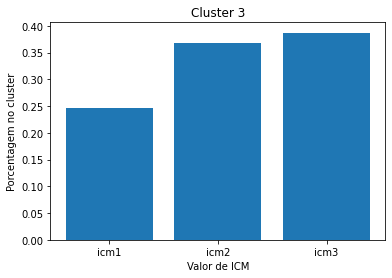

In [ ]:
fig = plt.figure()
plt.bar(['icm1', 'icm2', 'icm3'], [cluster3_icm1, cluster3_icm2, cluster3_icm3])
plt.xlabel("Valor de ICM")
plt.ylabel("Porcentagem no cluster")
plt.title("Cluster 3")
plt.show()

In [ ]:
tsne = TSNE(n_components=2, verbose=1, perplexity=5, learning_rate = 500, n_iter=4000, init='pca')
df_tsne = tsne.fit_transform(features)
df_tsne = pd.DataFrame(df_tsne)
df_tsne['label_cluster'] = kmeans.labels_

[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 1200 samples in 0.002s...
[t-SNE] Computed neighbors for 1200 samples in 0.018s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1200
[t-SNE] Computed conditional probabilities for sample 1200 / 1200
[t-SNE] Mean sigma: 1936.632130


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.997757
[t-SNE] KL divergence after 4000 iterations: 2.108162


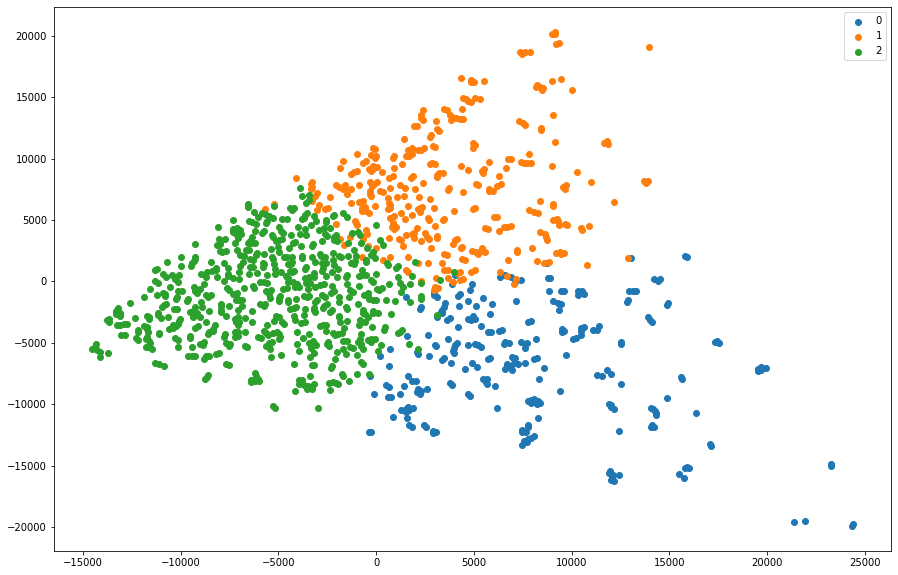

In [ ]:
u_labels = np.unique(kmeans.labels_)
fig = plt.figure(figsize=(15, 10))
for i in u_labels:
    plt.scatter(df_tsne[df_tsne['label_cluster'] == i][0] , df_tsne[df_tsne['label_cluster'] == i][1] , label = i)

plt.legend()
plt.show()

In [ ]:
groups = {}
for file, cluster in zip(files,kmeans.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

In [ ]:
def view_cluster(cluster):
    plt.figure(figsize = (25,25));
    # gets the list of filenames for a cluster
    files = groups[cluster]
    # only allow up to 30 images to be shown at a time
    if len(files) > 30:
        print(f"Clipping cluster size from {len(files)} to 30")
        files = files[:29]
    # plot each image in the cluster
    for index, file in enumerate(files):
        plt.subplot(10,10,index+1);
        try:
          img = imread(file)
          img = np.array(img)
          plt.imshow(img)
          plt.axis('off')
        except:
          file = file.replace('train', 'test')
          img = imread(file)
          img = np.array(img)
          plt.imshow(img)
          plt.axis('off')

In [ ]:
def plot_cluster_histogram(cluster, features):
  features_cluster = features.groupby('label_cluster').sum().iloc[cluster]
  values = list(features_cluster)
  values = [int(i) for i in values]
  print(values)

  fig = plt.figure(figsize=(8, 6))
  plt.bar(['asfalto', 'arvore', 'cimento', 'telhado1', 'telhado2', 'telhado3', 'grama', 'piscina', 'solo'], values)
  plt.xlabel("Feature")
  plt.ylabel("Quantidade de pixels no cluster")
  plt.title("Cluster {}".format(cluster))
  plt.show()

CLUSTER 0
Clipping cluster size from 253 to 30


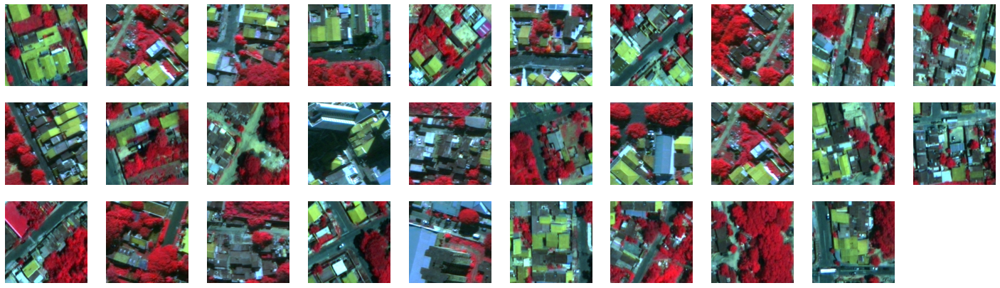

In [ ]:
print('CLUSTER 0')
view_cluster(0)

[771873, 4302977, 946372, 1675563, 1189281, 465329, 404982, 148757, 197666]


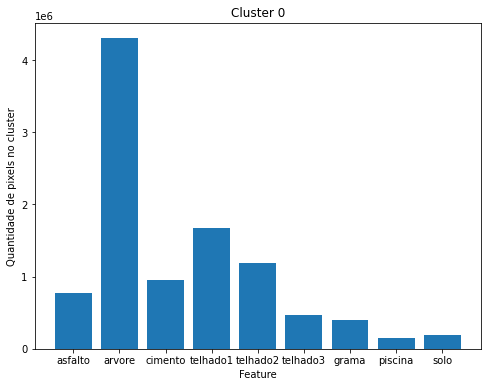

In [ ]:
plot_cluster_histogram(0, features2)

CLUSTER 1
Clipping cluster size from 332 to 30


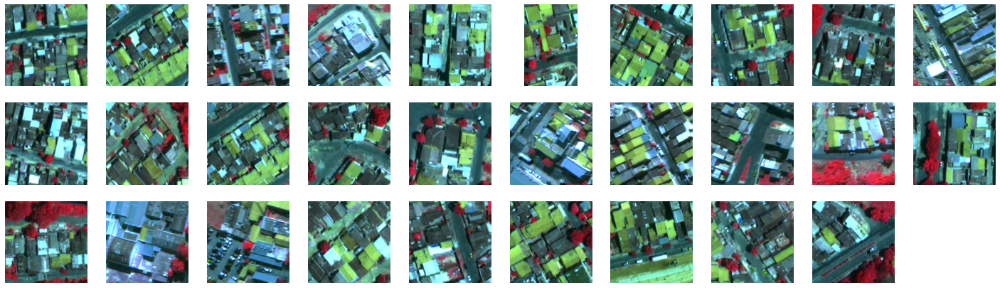

In [ ]:
print('CLUSTER 1')
view_cluster(1)

[1449856, 1614736, 1847590, 1734722, 4338043, 1107479, 694420, 135042, 302312]


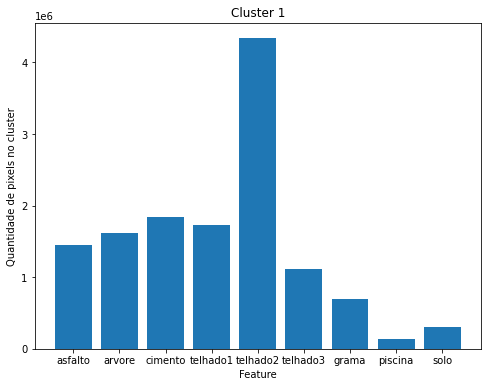

In [ ]:
plot_cluster_histogram(1, features2)

CLUSTER 2
Clipping cluster size from 615 to 30


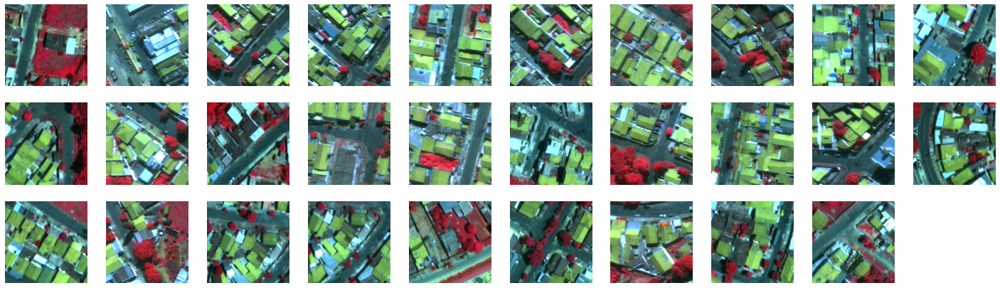

In [ ]:
print('CLUSTER 2')
view_cluster(2)

[4444403, 2907567, 3252955, 7935334, 2228150, 1122219, 1819023, 344951, 531598]


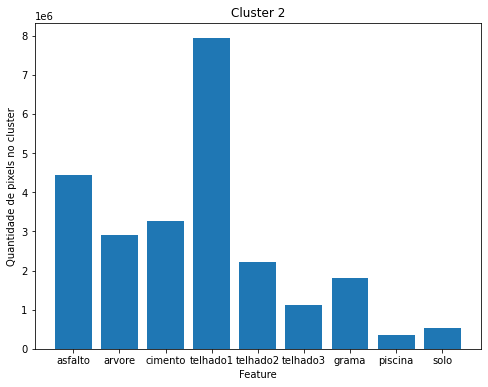

In [ ]:
plot_cluster_histogram(2, features2)

### 10 Clusters

In [ ]:
kmeans = KMeans(n_clusters=10, random_state=22)
kmeans.fit(features)

KMeans(n_clusters=10, random_state=22)

In [ ]:
features2 = features.copy()
features2['label_cluster'] = kmeans.labels_

In [ ]:
pca = PCA(2)
df_pca = pca.fit_transform(features)
df_pca = pd.DataFrame(df_pca)
df_pca['label_cluster'] = kmeans.labels_
df_pca['icm'] = classes

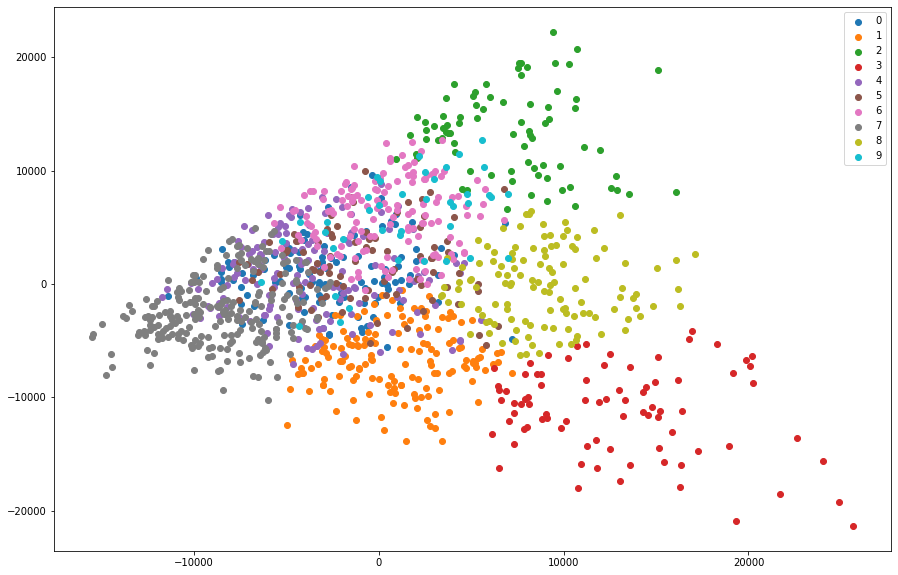

In [ ]:
u_labels = np.unique(kmeans.labels_)
fig = plt.figure(figsize=(15, 10))
for i in u_labels:
    plt.scatter(df_pca[df_pca['label_cluster'] == i][0] , df_pca[df_pca['label_cluster'] == i][1] , label = i)

plt.legend()
plt.show()

In [ ]:
groups = {}
for file, cluster in zip(files,kmeans.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

CLUSTER 0
Clipping cluster size from 117 to 30


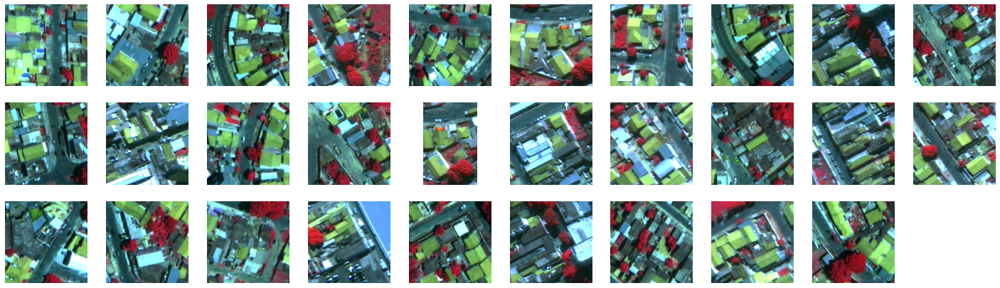

In [ ]:
print('CLUSTER 0')
view_cluster(0)

[493184, 548189, 1212748, 1151273, 511540, 304690, 267312, 73303, 103961]


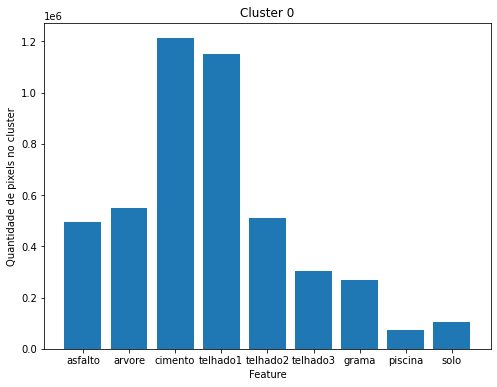

In [ ]:
plot_cluster_histogram(0, features2)

CLUSTER 1
Clipping cluster size from 151 to 30


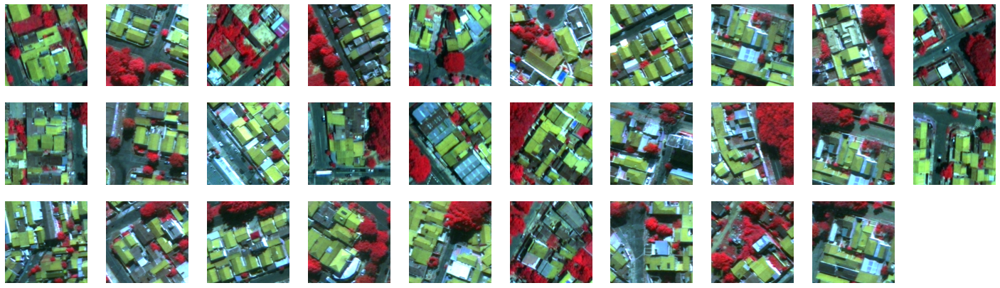

In [ ]:
print('CLUSTER 1')
view_cluster(1)

[596283, 1866698, 583503, 1871419, 479012, 210783, 225304, 108853, 83345]


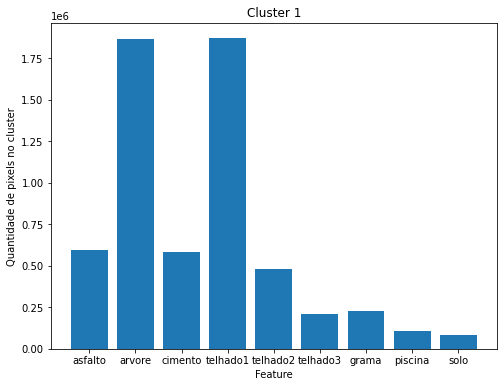

In [ ]:
plot_cluster_histogram(1, features2)

CLUSTER 2
Clipping cluster size from 81 to 30


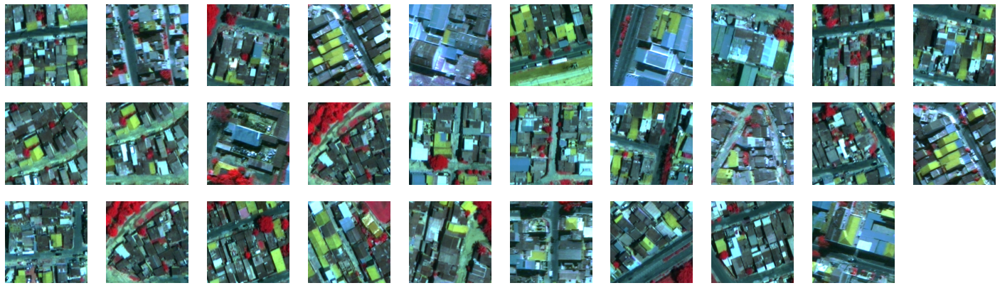

In [ ]:
print('CLUSTER 2')
view_cluster(2)

[226693, 319162, 353341, 328939, 1676395, 191634, 75790, 15379, 52667]


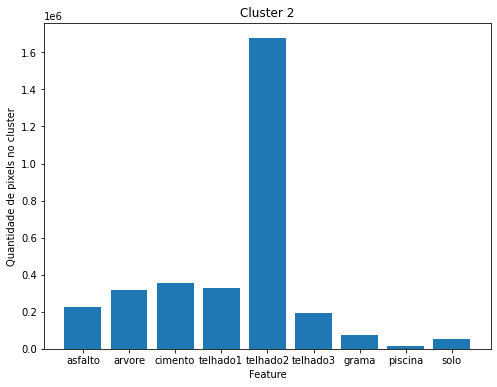

In [ ]:
plot_cluster_histogram(2, features2)

CLUSTER 3
Clipping cluster size from 81 to 30


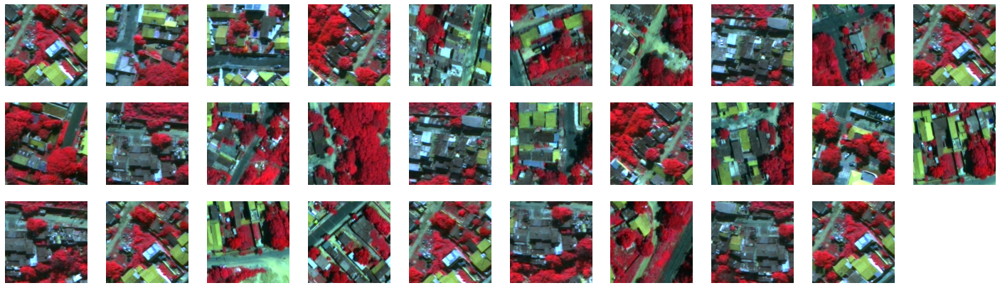

In [ ]:
print('CLUSTER 3')
view_cluster(3)

[151938, 1849918, 240864, 391147, 264151, 110752, 99802, 47681, 83747]


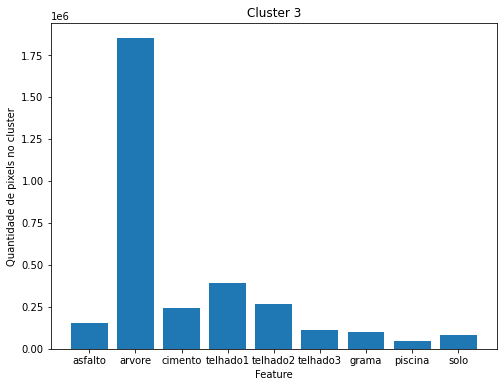

In [ ]:
plot_cluster_histogram(3, features2)

CLUSTER 4
Clipping cluster size from 151 to 30


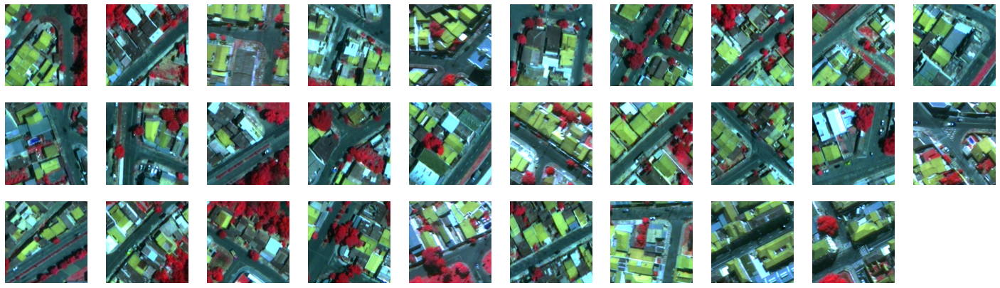

In [ ]:
print('CLUSTER 4')
view_cluster(4)

[1824769, 696908, 757522, 1253890, 564679, 336438, 375100, 60197, 170497]


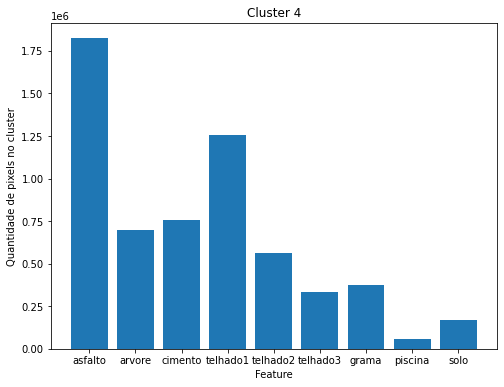

In [ ]:
plot_cluster_histogram(4, features2)

CLUSTER 5
Clipping cluster size from 87 to 30


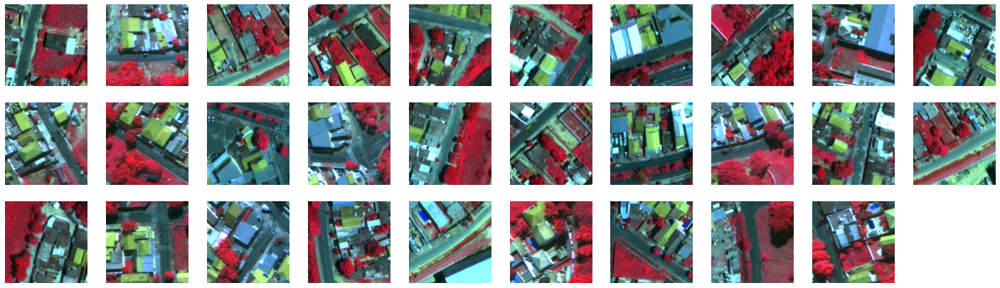

In [ ]:
print('CLUSTER 5')
view_cluster(5)

[528547, 405662, 532696, 444031, 319677, 208928, 896224, 40333, 103902]


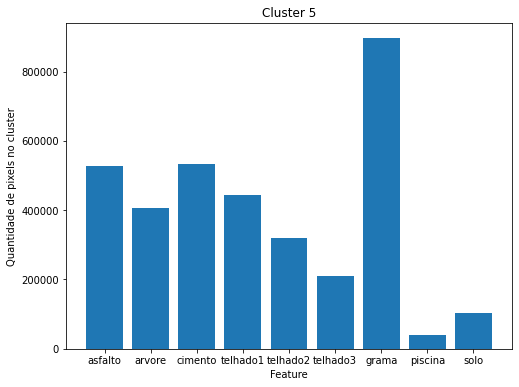

In [ ]:
plot_cluster_histogram(5, features2)

CLUSTER 6
Clipping cluster size from 142 to 30


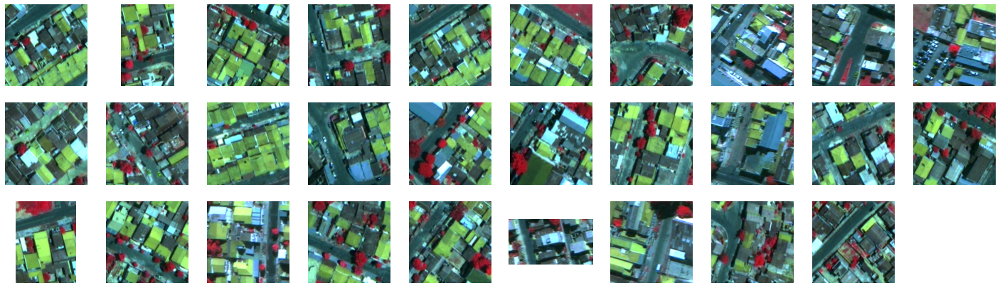

In [ ]:
print('CLUSTER 6')
view_cluster(6)

[797335, 559346, 738955, 1179994, 1677065, 235987, 256424, 73493, 105601]


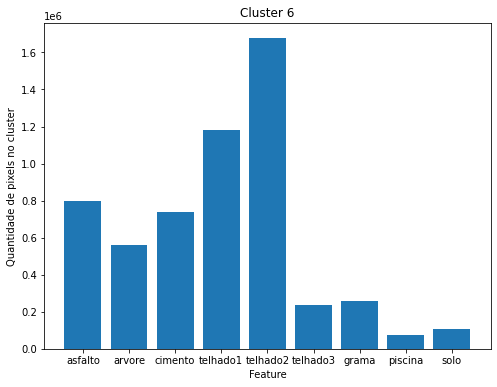

In [ ]:
plot_cluster_histogram(6, features2)

CLUSTER 7
Clipping cluster size from 229 to 30


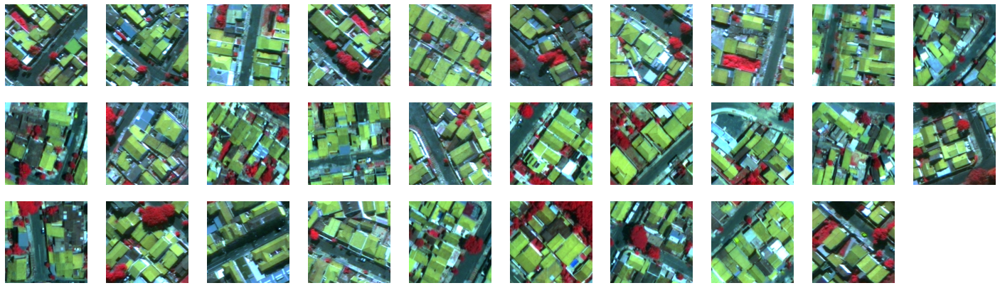

In [ ]:
print('CLUSTER 7')
view_cluster(7)

[1545587, 863754, 923530, 3998136, 811632, 268951, 469568, 139612, 139230]


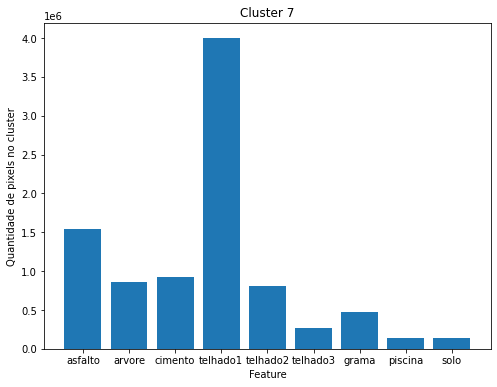

In [ ]:
plot_cluster_histogram(7, features2)

CLUSTER 8
Clipping cluster size from 120 to 30


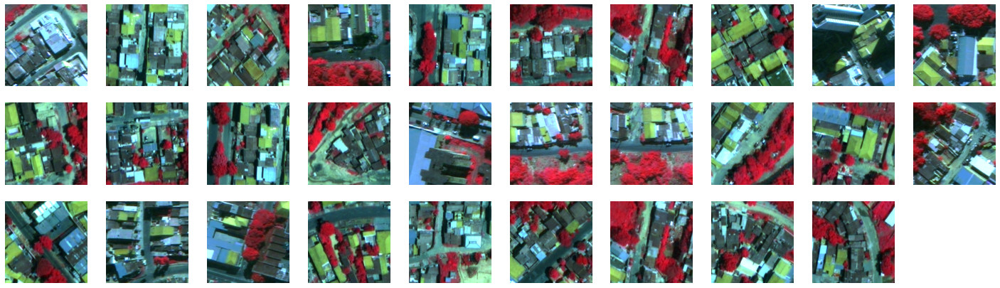

In [ ]:
print('CLUSTER 8')
view_cluster(8)

[324778, 1586374, 503906, 535657, 1165758, 328079, 163599, 59335, 130114]


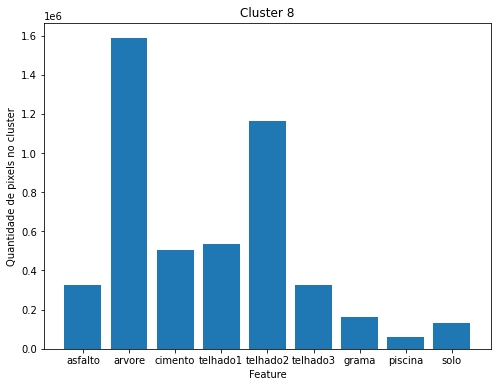

In [ ]:
plot_cluster_histogram(8, features2)

CLUSTER 9
Clipping cluster size from 41 to 30


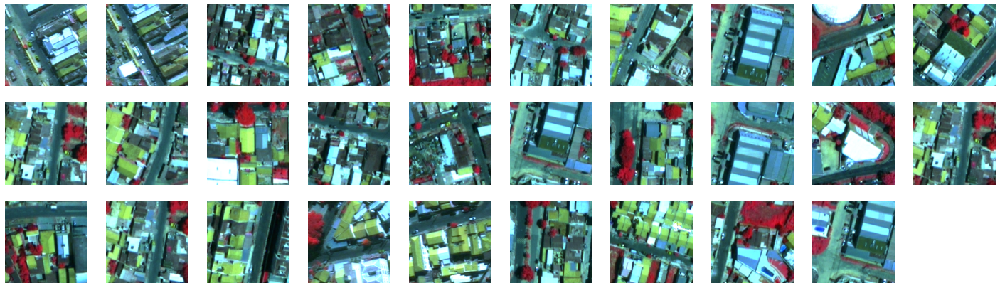

In [ ]:
print('CLUSTER 9')
view_cluster(9)

[177018, 129269, 199852, 191133, 285565, 498785, 89302, 10564, 58512]


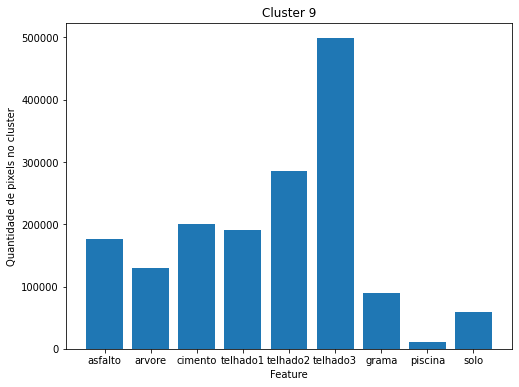

In [ ]:
plot_cluster_histogram(9, features2)